In [2]:
pip install torch torchvision torchaudio


  Using cached sympy-1.14.0-py3-none-any.whl.metadata (12 kB)
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 79.5/79.5 MB 32.2 MB/s eta 0:00:0000:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.9/1.9 MB 29.7 MB/s eta 0:00:00a 0:00:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 737.1/737.1 kB 22.7 MB/s eta 0:00:0000:01
Using cached sympy-1.14.0-py3-none-any.whl (6.3 MB)
  Attempting uninstall: sympy
    Found existing installation: sympy 1.12
    Uninstalling sympy-1.12:
      Successfully uninstalled sympy-1.12
Note: you may need to restart the kernel to use updated packages.


In [7]:
from pathlib import Path

root = Path.cwd()
if not (root / "checkpoints").exists():
    root = root.parent  # handles .ipynb_checkpoints

pts = sorted((root / "checkpoints").glob("*.pt"))
print("cwd:", Path.cwd())
print("root:", root)
print(f"Found {len(pts)} .pt files")
for p in pts[:20]:
    print(p.name)

# pick one (example)
ckpt_path = root / "checkpoints" / "Fire_Spread_convlstm_unet_Cd7_Cs15_H128_T1_nautilus.pt"


cwd: /Users/chrisjuarez/Downloads/ignis_ml_nautilus/.ipynb_checkpoints
root: /Users/chrisjuarez/Downloads/ignis_ml_nautilus
Found 7 .pt files
Fire_Spread_convlstm_unet_Cd7_Cs15_H128_T1_nautilus.pt
convlstm_unet_Cd7_Cs15_H128_T2_nautilus.pt
convlstm_unet_Cd7_Cs15_H128_T3_nautilus.pt
convlstm_unet_Cd7_Cs15_H128_T6_nautilus.pt
convlstm_unet_Cd7_Cs15_H96_T1_nautilus.pt
convlstm_unet_Cd7_Cs15_H96_T3_nautilus.pt
convlstm_unet_Cd7_Cs15_H96_T6_nautilus.pt


In [18]:
from pathlib import Path
import torch, pandas as pd

# Works from either project root or .ipynb_checkpoints
ckpt_dir = (Path.cwd() / "checkpoints")
if not ckpt_dir.exists():
    ckpt_dir = (Path.cwd().parent / "checkpoints")
ckpt_dir = ckpt_dir.resolve()

rows = []
for p in ckpt_dir.glob("*.pt"):
    d = torch.load(p, map_location="cpu")
    rows.append({
        "model": p.name,
        "val_csi": float(d.get("val_csi", -1)),
        "val_loss": float(d.get("val_loss", 1e9)),
        "best_threshold": float(d.get("best_threshold", 0.5)),
    })

if not rows:
    raise FileNotFoundError(f"No .pt files found in {ckpt_dir}")

df = pd.DataFrame(rows).sort_values(["val_csi", "val_loss"], ascending=[False, True]).reset_index(drop=True)
display(df)

best = df.iloc[0]
print(f"Best model: {best['model']} | val_csi={best['val_csi']:.4f} | th={best['best_threshold']:.2f}")


,model,val_csi,val_loss,best_threshold
0,convlstm_unet_Cd7_Cs15_H96_T6_nautilus.pt,0.523017,0.354695,0.850000
1,convlstm_unet_Cd7_Cs15_H96_T1_nautilus.pt,0.465546,0.400872,0.850000
2,convlstm_unet_Cd7_Cs15_H128_T2_nautilus.pt,0.229673,0.927693,0.900000
3,convlstm_unet_Cd7_Cs15_H96_T3_nautilus.pt,0.228993,0.814652,0.800000
4,convlstm_unet_Cd7_Cs15_H128_T3_nautilus.pt,0.220112,1.111113,0.896364
5,convlstm_unet_Cd7_Cs15_H128_T6_nautilus.pt,0.208912,1.137945,0.871818
6,Fire_Spread_convlstm_unet_Cd7_Cs15_H128_T1_nau...,0.208712,1.095960,0.847273


Best model: convlstm_unet_Cd7_Cs15_H96_T6_nautilus.pt | val_csi=0.5230 | th=0.85


In [19]:
import sys
from pathlib import Path
import torch

# Resolve repo root even if cwd is .ipynb_checkpoints
repo_root = Path.cwd()
if repo_root.name == ".ipynb_checkpoints":
    repo_root = repo_root.parent

if str(repo_root) not in sys.path:
    sys.path.append(str(repo_root))

ckpt_path = repo_root / "checkpoints" / "convlstm_unet_Cd7_Cs15_H96_T6_nautilus.pt"
if not ckpt_path.exists():
    pts = sorted((repo_root / "checkpoints").glob("*.pt"))
    assert pts, "No .pt files found in checkpoints/"
    ckpt_path = pts[0]

device = "cuda" if torch.cuda.is_available() else ("mps" if torch.backends.mps.is_available() else "cpu")

obj = torch.load(ckpt_path, map_location=device)
state_dict = obj.get("state_dict", obj)
meta = {k: v for k, v in obj.items() if k != "state_dict"}

print("Checkpoint:", ckpt_path)
print("Metadata:", meta)

from src.models.convlstm_unet import ConvLSTMUNet

cd = meta.get("cd")
cs = meta.get("cs")
hidden = meta.get("hidden", 64)
tile = meta.get("tile_size", 64)

if cd is None or cs is None:
    raise ValueError("Checkpoint missing cd/cs; set cd/cs manually (e.g. cd=7, cs=15).")

model = ConvLSTMUNet(Cd=cd, Cs=cs, hidden=hidden).to(device)
incompat = model.load_state_dict(state_dict, strict=False)
print("Missing keys:", incompat.missing_keys)
print("Unexpected keys:", incompat.unexpected_keys)

total = sum(p.numel() for p in model.parameters())
trainable = sum(p.numel() for p in model.parameters() if p.requires_grad)
print(f"Params: {trainable/1e6:.2f}M trainable / {total/1e6:.2f}M total")

seq_len = 1
x_dyn = torch.randn(1, seq_len, cd, tile, tile, device=device)
x_stat = torch.randn(1, cs, tile, tile, device=device)

model.eval()
with torch.no_grad():
    logits = model(x_dyn, x_stat)
    probs = torch.sigmoid(logits)

print("Output logits:", logits.shape, logits.min().item(), logits.max().item())
print("Output probs:", probs.shape, probs.min().item(), probs.max().item())

if "best_threshold" in meta:
    thr = float(meta["best_threshold"])
    frac = (probs > thr).float().mean().item()
    print(f"Fraction above best_threshold={thr:.2f}: {frac:.4f}")


Checkpoint: /Users/chrisjuarez/Downloads/ignis_ml_nautilus/checkpoints/convlstm_unet_Cd7_Cs15_H96_T6_nautilus.pt
Metadata: {'cd': 7, 'cs': 15, 'tile_size': 64, 'hidden': 96, 'dyn_order': ['fire_t', 'u', 'v', 'gust', 'tempC', 'q', 'precip'], 'stat_order': ['elev', 'slope', 'aspect_cos', 'aspect_sin', 'ndvi', 'bi', 'erc', 'pdsi', 'chili', 'impervious', 'water', 'population', 'fuel1', 'fuel2', 'fuel3'], 'prior_pos': 0.021554403130449, 'best_threshold': 0.85, 'val_loss': 0.3546954116018692, 'val_csi': 0.5230169659203822}
Missing keys: []
Unexpected keys: []
Params: 1.68M trainable / 1.68M total
Output logits: torch.Size([1, 1, 256, 256]) -16.268699645996094 7.94074010848999
Output probs: torch.Size([1, 1, 256, 256]) 8.601882228731483e-08 0.9996441602706909
Fraction above best_threshold=0.85: 0.0227


In [47]:
import re, sys
from pathlib import Path
import torch

# --- resolve repo root ---
root = Path.cwd()
if root.name == ".ipynb_checkpoints":
    root = root.parent
if str(root) not in sys.path:
    sys.path.append(str(root))

# --- pick checkpoint ---
ckpt_path = root / "checkpoints" / "convlstm_unet_Cd7_Cs15_H96_T1_nautilus.pt"
if not ckpt_path.exists():
    pts = sorted((root / "checkpoints").glob("*.pt"))
    assert pts, "No .pt files found in checkpoints/"
    ckpt_path = pts[0]

device = "cuda" if torch.cuda.is_available() else ("mps" if torch.backends.mps.is_available() else "cpu")

obj = torch.load(ckpt_path, map_location=device)
state_dict = obj.get("state_dict", obj)
meta = {k: v for k, v in obj.items() if k != "state_dict"}

from src.models.convlstm_unet import ConvLSTMUNet
from src.data.dataset import NpzTileDataset

cd = meta.get("cd")
cs = meta.get("cs")
hidden = meta.get("hidden", 64)
tile = meta.get("tile_size", 64)

if cd is None or cs is None:
    raise ValueError("Checkpoint missing cd/cs; set cd/cs manually.")

# infer seq_len from checkpoint filename like *_T1_*.pt
m = re.search(r"_T(\d+)_", ckpt_path.name)
seq_len = int(m.group(1)) if m else None

model = ConvLSTMUNet(Cd=cd, Cs=cs, hidden=hidden).to(device)
model.load_state_dict(state_dict, strict=False)
model.eval()

# --- pick a real tile ---
tiles_dir = root / "data" / "mNDWS_500m_T6"
if tiles_dir.exists():
    npz_files = sorted(tiles_dir.glob("*.npz"))
else:
    npz_files = sorted(root.rglob("*.npz"))

assert npz_files, "No .npz files found under data/"
npz_path = npz_files[0]   # change this to any tile you want

# --- dataset handles normalization + channel order ---
expected_dyn = meta.get("dyn_order") or ["fire_t","u","v","gust","tempC","q","precip"]
expected_stat = meta.get("stat_order") or ["elev","slope","aspect_cos","aspect_sin","ndvi","bi","erc","pdsi","chili","impervious","water","population","fuel1","fuel2","fuel3"]

ds = NpzTileDataset(
    [npz_path],
    augment=False,
    expected_dyn_order=expected_dyn,
    expected_stat_order=expected_stat,
    seq_len=seq_len,
    res_m=500.0,
    normalize=True,
    fire_boost=5.0,
    compute_slope_aspect=True,
)

x_dyn, x_stat, y = ds[0]  # [T,Cd,H,W], [Cs,H,W], [1,H,W]

# batch dimension
x_dyn = x_dyn.unsqueeze(0).to(device)
x_stat = x_stat.unsqueeze(0).to(device)

with torch.no_grad():
    logits = model(x_dyn, x_stat)
    probs = torch.sigmoid(logits)

print("Tile:", npz_path)
print("x_dyn:", x_dyn.shape, "x_stat:", x_stat.shape, "y:", y.shape)
print("logits:", logits.shape, logits.min().item(), logits.max().item())
print("probs :", probs.shape, probs.min().item(), probs.max().item())

if "best_threshold" in meta:
    thr = float(meta["best_threshold"])
    frac = (probs > thr).float().mean().item()
    print(f"Fraction above best_threshold={thr:.2f}: {frac:.4f}")


Tile: /Users/chrisjuarez/Downloads/ignis_ml_nautilus/data/mNDWS_500m_T6/cleaned_eval_ndws_conus_western_000_000000.npz
x_dyn: torch.Size([1, 1, 7, 64, 64]) x_stat: torch.Size([1, 15, 64, 64]) y: torch.Size([1, 64, 64])
logits: torch.Size([1, 1, 256, 256]) -11.025249481201172 6.456937789916992
probs : torch.Size([1, 1, 256, 256]) 1.6285006495309062e-05 0.9984328150749207
Fraction above best_threshold=0.85: 0.0022


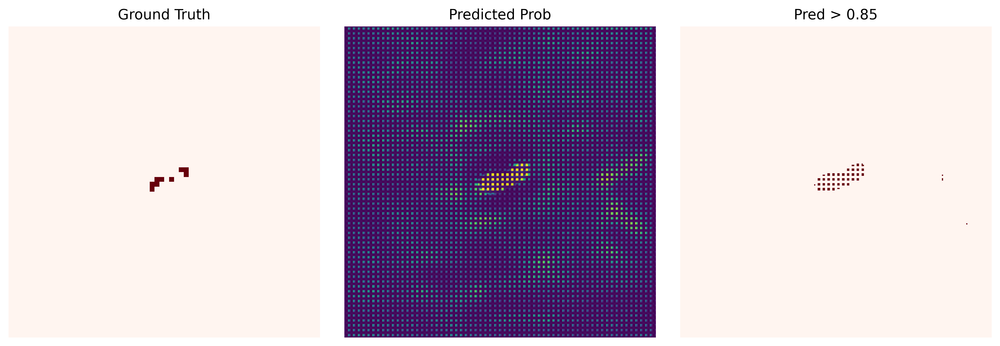

In [52]:
import matplotlib.pyplot as plt

# use the tensors from the previous cell:
# probs: [1,1,H,W], y: [1,H,W]

pred = probs[0, 0].detach().cpu().numpy()
gt = y[0].detach().cpu().numpy()

thr = float(meta.get("best_threshold", 0.5))
pred_bin = (pred > thr).astype("float32")

fig, ax = plt.subplots(1, 3, figsize=(12, 4))
ax[0].imshow(gt, cmap="Reds")
ax[0].set_title("Ground Truth")
ax[1].imshow(pred, cmap="viridis")
ax[1].set_title("Predicted Prob")
ax[2].imshow(pred_bin, cmap="Reds")
ax[2].set_title(f"Pred > {thr:.2f}")

for a in ax:
    a.axis("off")
plt.tight_layout()


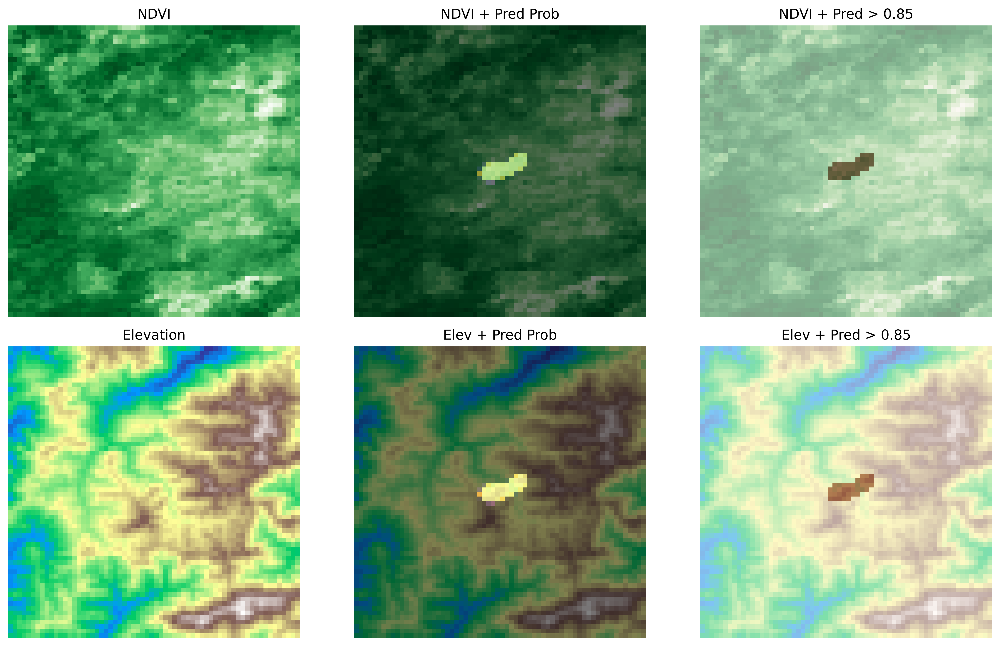

In [46]:
import numpy as np
import matplotlib.pyplot as plt

# x_stat: [1, Cs, H, W] from previous cell
# expected_stat: list of channel names from previous cell
x_stat_cpu = x_stat[0].detach().cpu().numpy()  # [Cs, H, W]
pred = probs[0, 0].detach().cpu().numpy()
gt = y[0].detach().cpu().numpy()
thr = float(meta.get("best_threshold", 0.5))
pred_bin = (pred > thr).astype(np.float32)

def get_band(name):
    if name not in expected_stat:
        raise ValueError(f"{name} not in expected_stat")
    idx = expected_stat.index(name)
    return x_stat_cpu[idx]

ndvi = get_band("ndvi")
elev = get_band("elev")

fig, ax = plt.subplots(2, 3, figsize=(13, 8))

# NDVI background + overlays
ax[0,0].imshow(ndvi, cmap="Greens")
ax[0,0].set_title("NDVI")
ax[0,1].imshow(ndvi, cmap="Greens")
ax[0,1].imshow(pred, cmap="inferno", alpha=0.5)
ax[0,1].set_title("NDVI + Pred Prob")
ax[0,2].imshow(ndvi, cmap="Greens")
ax[0,2].imshow(pred_bin, cmap="Reds", alpha=0.5)
ax[0,2].set_title(f"NDVI + Pred > {thr:.2f}")

# Elevation background + overlays
ax[1,0].imshow(elev, cmap="terrain")
ax[1,0].set_title("Elevation")
ax[1,1].imshow(elev, cmap="terrain")
ax[1,1].imshow(pred, cmap="inferno", alpha=0.5)
ax[1,1].set_title("Elev + Pred Prob")
ax[1,2].imshow(elev, cmap="terrain")
ax[1,2].imshow(pred_bin, cmap="Reds", alpha=0.5)
ax[1,2].set_title(f"Elev + Pred > {thr:.2f}")

for a in ax.ravel():
    a.axis("off")
plt.tight_layout()


In [42]:
import torch.nn.functional as F

# Resize logits to match tile size (same as training)
H, W = y.shape[-2:]
if logits.shape[-2:] != (H, W):
    logits = F.interpolate(logits, size=(H, W), mode="bilinear", align_corners=False)

probs = torch.sigmoid(logits)


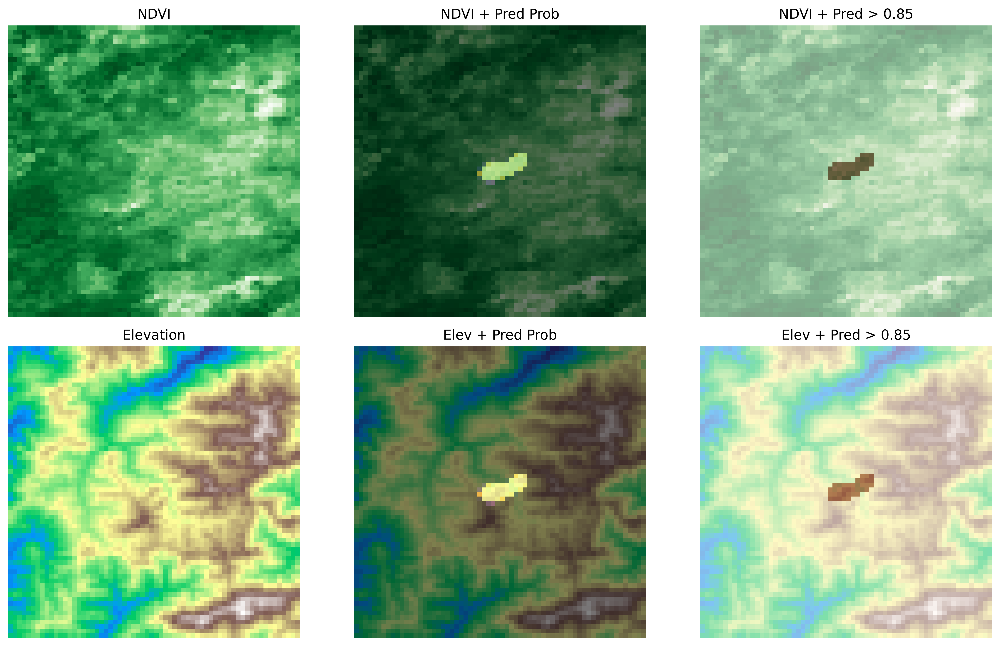

In [43]:
import numpy as np
import matplotlib.pyplot as plt

x_stat_cpu = x_stat[0].detach().cpu().numpy()  # [Cs,H,W]
pred = probs[0, 0].detach().cpu().numpy()
gt = y[0].detach().cpu().numpy()
thr = float(meta.get("best_threshold", 0.5))
pred_bin = (pred > thr).astype(np.float32)

def get_band(name):
    idx = expected_stat.index(name)
    return x_stat_cpu[idx]

ndvi = get_band("ndvi")
elev = get_band("elev")

fig, ax = plt.subplots(2, 3, figsize=(13, 8))

# NDVI
ax[0,0].imshow(ndvi, cmap="Greens"); ax[0,0].set_title("NDVI")
ax[0,1].imshow(ndvi, cmap="Greens"); ax[0,1].imshow(pred, cmap="inferno", alpha=0.5); ax[0,1].set_title("NDVI + Pred Prob")
ax[0,2].imshow(ndvi, cmap="Greens"); ax[0,2].imshow(pred_bin, cmap="Reds", alpha=0.5); ax[0,2].set_title(f"NDVI + Pred > {thr:.2f}")

# Elev
ax[1,0].imshow(elev, cmap="terrain"); ax[1,0].set_title("Elevation")
ax[1,1].imshow(elev, cmap="terrain"); ax[1,1].imshow(pred, cmap="inferno", alpha=0.5); ax[1,1].set_title("Elev + Pred Prob")
ax[1,2].imshow(elev, cmap="terrain"); ax[1,2].imshow(pred_bin, cmap="Reds", alpha=0.5); ax[1,2].set_title(f"Elev + Pred > {thr:.2f}")

for a in ax.ravel():
    a.axis("off")
plt.tight_layout()


In [44]:
%config InlineBackend.figure_format = "retina"
plt.rcParams["figure.dpi"] = 180
plt.rcParams["savefig.dpi"] = 300


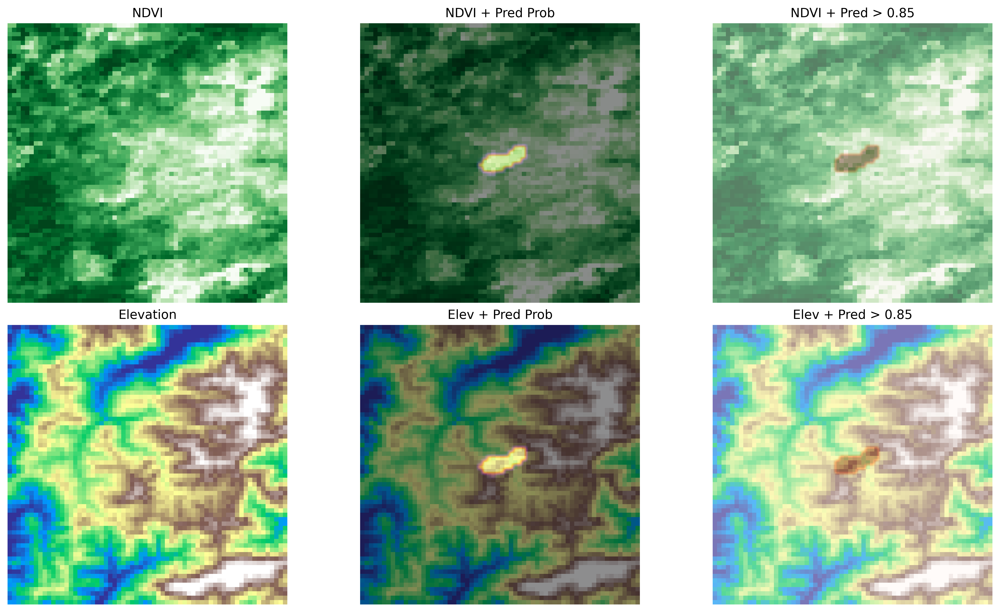

<Figure size 1152x864 with 0 Axes>

In [45]:
import numpy as np
import matplotlib.pyplot as plt
import torch.nn.functional as F

# Optional in notebooks for sharper inline output:
# %config InlineBackend.figure_format = "retina"

def normalize_for_display(a, q=(2, 98)):
    lo, hi = np.nanpercentile(a, q)
    return np.clip((a - lo) / (hi - lo + 1e-8), 0, 1)

def get_band(x_stat_cpu, expected_stat, name):
    try:
        return x_stat_cpu[expected_stat.index(name)]
    except ValueError as e:
        raise KeyError(f"Band '{name}' not found in expected_stat") from e

# Match prediction resolution to input resolution (important for overlay quality)
target_hw = tuple(x_stat.shape[-2:])  # (H, W)
pred_t = probs[0, 0].detach()
if tuple(pred_t.shape) != target_hw:
    pred_t = F.interpolate(
        pred_t[None, None], size=target_hw, mode="bilinear", align_corners=False
    )[0, 0]

x_stat_cpu = x_stat[0].detach().cpu().numpy()   # [Cs, H, W]
pred = pred_t.cpu().numpy()                     # [H, W]
gt = y[0].detach().cpu().numpy()                # kept if you need it

thr = float(meta.get("best_threshold", 0.5))
pred_bin = (pred > thr).astype(np.float32)

ndvi = get_band(x_stat_cpu, expected_stat, "ndvi")
elev = get_band(x_stat_cpu, expected_stat, "elev")

# Better visual contrast
ndvi_vis = normalize_for_display(ndvi)
elev_vis = normalize_for_display(elev)

fig, ax = plt.subplots(2, 3, figsize=(14, 8), dpi=180, constrained_layout=True)

panels = [
    (ndvi_vis, "Greens", None, None, "NDVI"),
    (ndvi_vis, "Greens", pred, "inferno", "NDVI + Pred Prob"),
    (ndvi_vis, "Greens", pred_bin, "Reds", f"NDVI + Pred > {thr:.2f}"),
    (elev_vis, "terrain", None, None, "Elevation"),
    (elev_vis, "terrain", pred, "inferno", "Elev + Pred Prob"),
    (elev_vis, "terrain", pred_bin, "Reds", f"Elev + Pred > {thr:.2f}"),
]

for a, (base, base_cmap, overlay, overlay_cmap, title) in zip(ax.ravel(), panels):
    a.imshow(base, cmap=base_cmap, interpolation="none")
    if overlay is not None:
        alpha = 0.45 if overlay is pred else 0.35
        a.imshow(overlay, cmap=overlay_cmap, alpha=alpha, interpolation="bilinear", vmin=0, vmax=1)
    a.set_title(title)
    a.axis("off")

plt.show()
# Optional high-res export:
plt.savefig("overlay_viz.png", dpi=300, bbox_inches="tight")


In [ ]:
from pathlib import Path
import sys
import torch

# Find project root even if notebook cwd is .ipynb_checkpoints
root = Path.cwd()
if not (root / "config.yaml").exists():
    root = root.parent

if str(root) not in sys.path:
    sys.path.insert(0, str(root))

from src.utils.config import load_config
from src.data.dataset import NpzTileDataset

CFG = load_config(root / "config.yaml")
expected_stat = CFG.channels.static_order
expected_dyn = CFG.channels.dynamic_order

def resolve_split(txt_path, tiles_dir):
    by_name = {p.name: p.resolve() for p in Path(tiles_dir).glob("*.npz")}
    files = []
    for line in Path(txt_path).read_text().splitlines():
        line = line.strip()
        if not line:
            continue
        p = Path(line)
        if p.exists():
            files.append(p.resolve())
        elif p.name in by_name:
            files.append(by_name[p.name])
    return files

val_files = resolve_split(root / "data/splits/val.txt", CFG.datasets["mndws"].tiles_dir)

ds_va = NpzTileDataset(
    val_files,
    augment=False,
    expected_dyn_order=expected_dyn,
    expected_stat_order=expected_stat,
    seq_len=6,  # keep T6
    res_m=CFG.grid.res_m,
    normalize=True,
    fire_boost=5.0,
    compute_slope_aspect=True,
)

device = "cuda" if torch.cuda.is_available() else "cpu"
print("val tiles:", len(ds_va), "| device:", device)


val tiles: 3074 | device: cpu


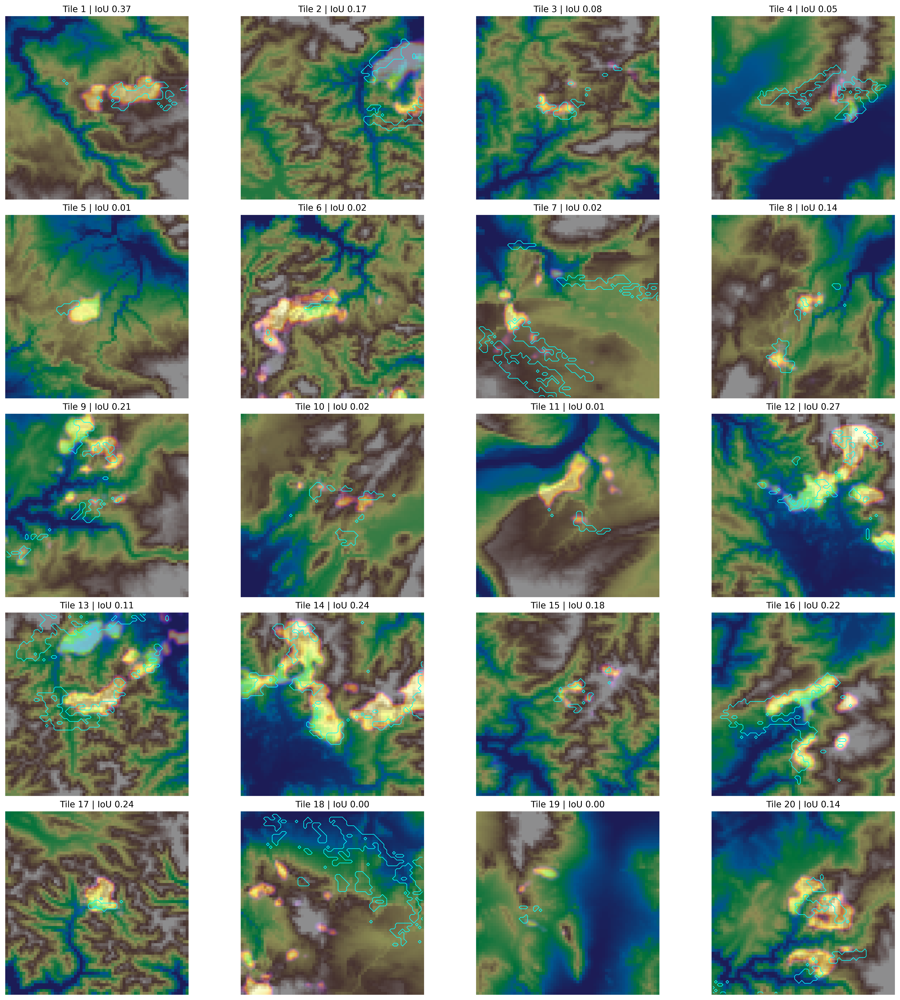

In [58]:
thr = float(meta.get("best_threshold", 0.85)) if isinstance(meta, dict) else 0.85
show_random_tiles(model, ds_va, expected_stat, device=device, n=20, batch_size=8, thr=thr, seed=42)


/var/folders/6w/03_jn3sx0t54yml9hc5g1mpm0000gp/T/ipykernel_77025/1803203438.py:103: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  Patch(facecolor=plt.cm.get_cmap(base_cmap)(0.6), label=f"{base_band.upper()} background"),
/var/folders/6w/03_jn3sx0t54yml9hc5g1mpm0000gp/T/ipykernel_77025/1803203438.py:106: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout(rect=[0, 0.05, 1, 1])


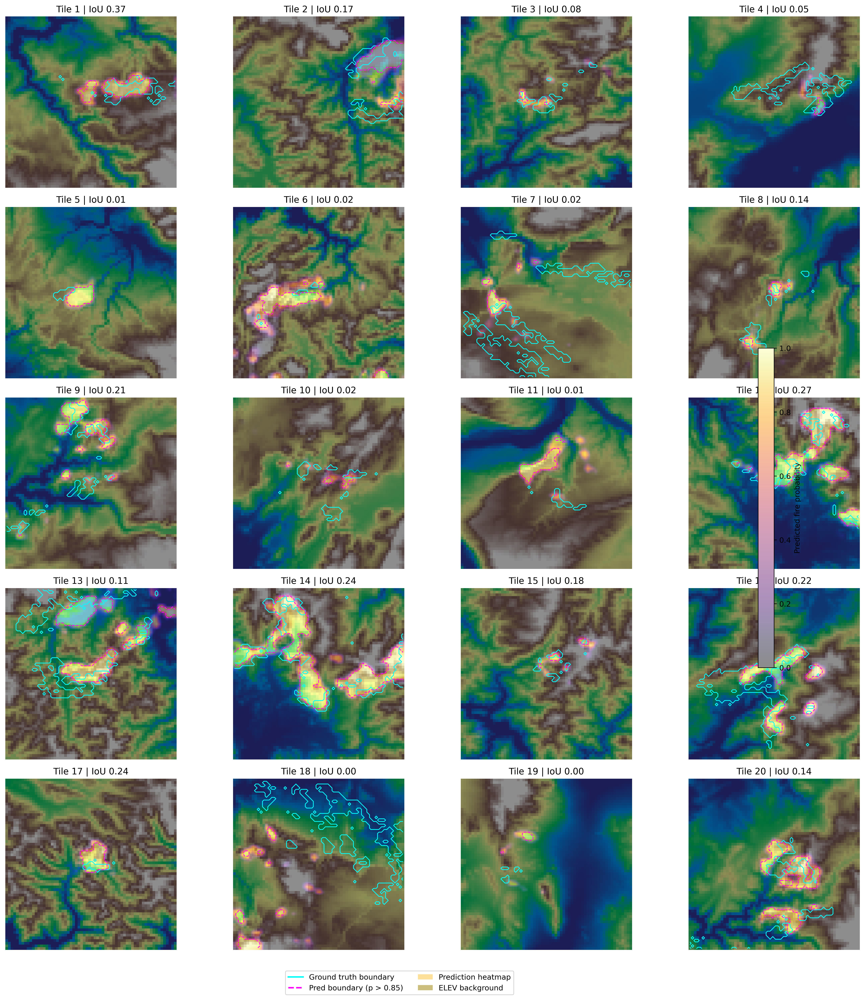

In [59]:
import math
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.lines import Line2D
from matplotlib.patches import Patch
import torch
import torch.nn.functional as F
from torch.utils.data import DataLoader

def normalize_for_display(a, q=(2, 98)):
    lo, hi = np.nanpercentile(a, q)
    return np.clip((a - lo) / (hi - lo + 1e-8), 0, 1)

def iou_np(pred_bin, gt_bin):
    inter = np.logical_and(pred_bin, gt_bin).sum()
    union = np.logical_or(pred_bin, gt_bin).sum()
    return float(inter / (union + 1e-6))

@torch.no_grad()
def show_random_tiles(
    model,
    dataset,
    expected_stat,
    device,
    n=20,
    batch_size=8,
    thr=0.85,
    seed=42,
    base_band="elev",   # "elev" or "ndvi"
):
    model.eval().to(device)

    loader = DataLoader(
        dataset,
        batch_size=batch_size,
        shuffle=True,
        generator=torch.Generator().manual_seed(seed),
    )

    band_idx = expected_stat.index(base_band)
    base_cmap = "terrain" if base_band == "elev" else "Greens"

    cols = 4
    rows = math.ceil(n / cols)
    fig, axes = plt.subplots(rows, cols, figsize=(4.4 * cols, 3.8 * rows), dpi=180)
    axes = np.array(axes).reshape(rows, cols)

    shown = 0
    last_prob_im = None

    for x_dyn, x_stat, y in loader:
        x_dyn = x_dyn.to(device)
        x_stat_dev = x_stat.to(device)
        y_dev = y.to(device)

        logits = model(x_dyn, x_stat_dev)
        if logits.shape[-2:] != y_dev.shape[-2:]:
            logits = F.interpolate(logits, size=y_dev.shape[-2:], mode="bilinear", align_corners=False)

        probs = torch.sigmoid(logits).cpu().numpy()[:, 0]   # [B,H,W]
        xs = x_stat.cpu().numpy()                           # [B,Cs,H,W]
        ys = y.cpu().numpy()[:, 0]                          # [B,H,W]

        for i in range(probs.shape[0]):
            if shown >= n:
                break

            pred = probs[i]
            pred_bin = pred > thr
            gt_bin = ys[i] > 0.5

            base = normalize_for_display(xs[i, band_idx])

            r, c = divmod(shown, cols)
            a = axes[r, c]

            a.imshow(base, cmap=base_cmap, interpolation="none")
            last_prob_im = a.imshow(
                pred, cmap="inferno", alpha=0.45, interpolation="bilinear", vmin=0, vmax=1
            )
            a.contour(gt_bin.astype(float), levels=[0.5], colors="cyan", linewidths=1.0)
            a.contour(pred_bin.astype(float), levels=[0.5], colors="magenta", linewidths=1.0, linestyles="--")

            a.set_title(f"Tile {shown+1} | IoU {iou_np(pred_bin, gt_bin):.2f}")
            a.axis("off")
            shown += 1

        if shown >= n:
            break

    for k in range(shown, rows * cols):
        r, c = divmod(k, cols)
        axes[r, c].axis("off")

    if last_prob_im is not None:
        cbar = fig.colorbar(last_prob_im, ax=axes.ravel().tolist(), fraction=0.022, pad=0.01)
        cbar.set_label("Predicted fire probability")

    handles = [
        Line2D([0], [0], color="cyan", lw=2, label="Ground truth boundary"),
        Line2D([0], [0], color="magenta", lw=2, ls="--", label=f"Pred boundary (p > {thr:.2f})"),
        Patch(facecolor=plt.cm.inferno(0.85), alpha=0.45, label="Prediction heatmap"),
        Patch(facecolor=plt.cm.get_cmap(base_cmap)(0.6), label=f"{base_band.upper()} background"),
    ]
    fig.legend(handles=handles, loc="lower center", ncol=2, frameon=True, bbox_to_anchor=(0.5, 0.01))
    fig.tight_layout(rect=[0, 0.05, 1, 1])
    plt.show()

# Run:
thr = float(meta.get("best_threshold", 0.85)) if ("meta" in globals() and isinstance(meta, dict)) else 0.85
show_random_tiles(model, ds_va, expected_stat, device=device, n=20, batch_size=8, thr=thr, seed=42, base_band="elev")
